# Image Segmentation - part 2

In [ ]:
import os
import skimage
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 2, figsize=(20,80))

# loading images from folder
list_files = os.listdir('images')
image_list = []
for filename in list_files:
    image_list.append(skimage.io.imread('images\\' + filename))

### Segmentation by thresholding - using thresholding techniques

Local thresholding approach developed to improve the quality of microscopic image.

Niblack and Sauvola thresholding technique warks by changing the threshold depending on the local mean and standard deviation for each pixel in a sliding window.

Otsu thresholding technique works by iterating over all possible thresholds values and computing the dispersion for the sample points on either side of the threshold. The idea is to get the smallest foreground and background dispersion possible.


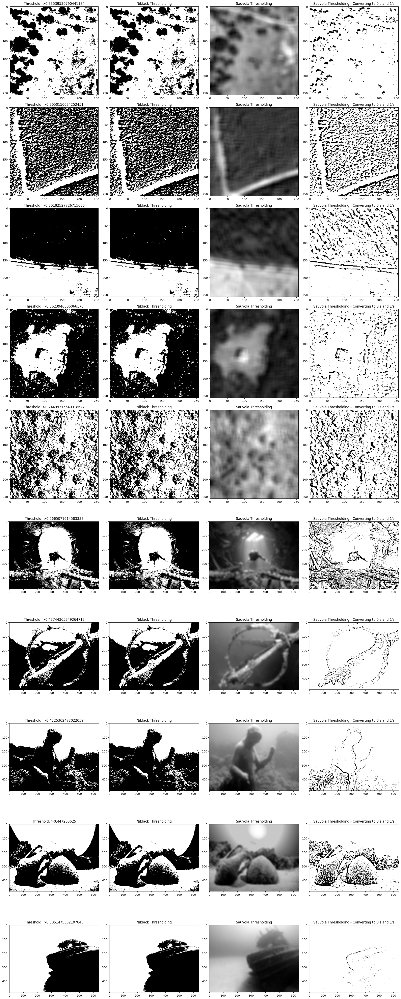

In [ ]:
from skimage import filters

# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 4, figsize=(20,50))

# displaying the images
for idx, image in enumerate(image_list):
    # converting RGB image to gray
    gray = rgb2gray(image)

    # Computing Otsu's thresholding value
    threshold = filters.threshold_otsu(gray)
    binarized_gray = (gray > threshold)*1
    axes[idx,0].title.set_text("Threshold: >" + str(threshold))
    axes[idx,0].imshow(binarized_gray, cmap="gray")

    # Computing Ni black's local pixel
    # threshold values for every pixel
    threshold = filters.threshold_niblack(gray)
    binarized_coffee = (binarized_gray > threshold)*1
    axes[idx,1].title.set_text("Niblack Thresholding")
    axes[idx,1].imshow(binarized_gray, cmap="gray")

    # Computing Sauvola's local pixel threshold
    # values for every pixel - Not Binarized
    threshold = filters.threshold_sauvola(gray)
    axes[idx,2].title.set_text("Sauvola Thresholding")
    axes[idx,2].imshow(threshold, cmap="gray")

    # Computing Sauvola's local pixel
    # threshold values for every pixel - Binarized
    binarized_coffee = (gray > threshold)*1
    axes[idx,3].title.set_text("Sauvola Thresholding - Converting to 0's and 1's")
    axes[idx,3].imshow(binarized_coffee, cmap="gray")
    

plt.tight_layout()

# Active Contour Segmentation

The concept of energy functional reduction underpins the active contour method. An active contour is a segmentation approach that uses energy forces and restrictions to separate the pixels of interest from the remainder of the picture for further processing and analysis. The term “active contour” refers to a model in the segmentation process. 

The active contour model is among the dynamic approaches in image segmentation that uses the image’s energy restrictions and pressures to separate regions of interest. For segmentation, an active contour establishes a different border or curvature for each section of the target object. The active contour model is a technique for minimizing the energy function resulting from external and internal forces. An exterior force is specified as curves or surfaces, while an interior force is defined as picture data. The external force is a force that allows initial outlines to automatically transform into the forms of objects in pictures.

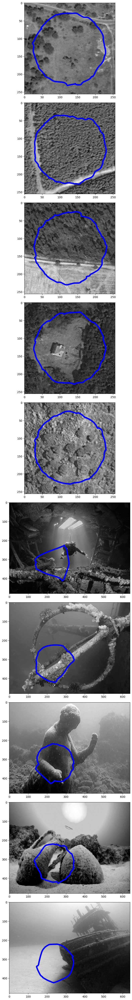

In [30]:
from skimage.filters import gaussian
from skimage.segmentation import active_contour
import numpy as np

# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 1, figsize=(20,50))

# displaying the images
for idx, image in enumerate(image_list):
    # converting RGB image to gray
    gray = rgb2gray(image)
    # Applying Gaussian Filter to remove noise
    gauss_img = gaussian(gray, 1)
    # Localising the circle's center at 220, 110
    x1 = int(image.shape[0]/2) + 100*np.cos(np.linspace(0, 2*np.pi, 500))
    x2 = int(image.shape[1]/2) + 100*np.sin(np.linspace(0, 2*np.pi, 500))
    # Generating a circle based on x1, x2
    snake = np.array([x1, x2]).T
    # Computing the Active Contour for the given image
    img_snake = active_contour(gauss_img, snake)
    axes[idx].imshow(gray, cmap="gray")
    axes[idx].plot(img_snake[:, 0], img_snake[:, 1], '-b', lw=5)

plt.tight_layout()

# Chan-Vese Segmentation

Splits a picture into two groups with the lowest intra-class variance.

This algorithm uses sets that are iteratively evolved to minimize energy, which is characterized by weights corresponding to the total of variations in intensity from the overall average outside the segmented region, the sum of differences from the overall average within the feature vector, and a term that is directly proportional to the length of the fragmented region’s edge.

This model is commonly used in medical imaging.

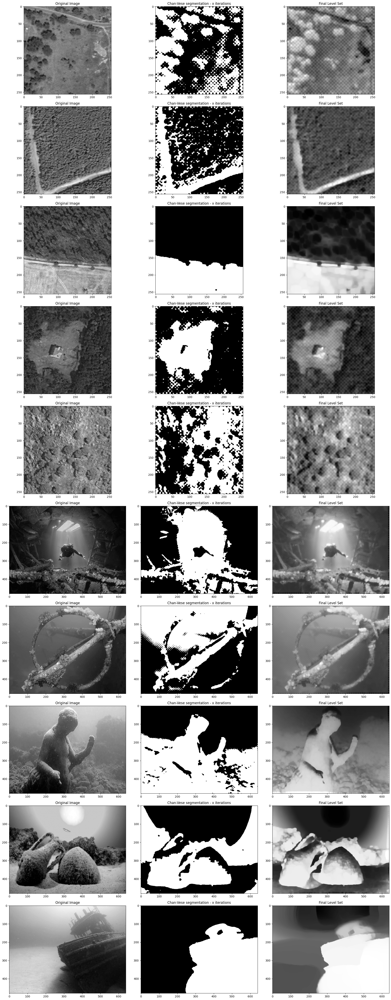

In [3]:
from skimage.segmentation import chan_vese

# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 3, figsize=(20,50))

# displaying the images
for idx, image in enumerate(image_list):
    # converting RGB image to gray
    gray = rgb2gray(image)
    # Computing the Chan VESE segmentation technique
    chanvase_img = chan_vese(gray,extended_output=True)
    # Plotting
    axes[idx,0].imshow(gray, cmap="gray")
    axes[idx,0].title.set_text("Original Image")
    axes[idx,1].imshow(chanvase_img[0], cmap="gray")
    axes[idx,1].title.set_text("Chan-Vese segmentation - x iterations")
    axes[idx,2].imshow(chanvase_img[1], cmap="gray")
    axes[idx,2].title.set_text("Final Level Set")
   

plt.tight_layout()